In [1]:
# import warnings
# warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import torchvision.datasets as datasets
import torchvision.utils as vutils

import numpy as np
import csv
import pandas as pd
import numpy as np
import cv2
import glob
import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import torchvision
from torchvision.io import read_image
from IPython.display import HTML

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
# device = torch.device('cpu')
device

device(type='cuda')

In [ ]:
# # download CASIA-WebFace dataset if in COLAB

!unzip /content/drive/MyDrive/thesis/CASIA-WebFace.zip

# !gdown --id 1Of_EVz-yHV7QVWQGihYfvtny9Ne8qXVz -O CASIA-WebFace.zip
# !unzip /content/CASIA-WebFace.zip
# !rm /content/CASIA-WebFace.zip

In [5]:
data = []

labels_paths = glob.glob('/content/CASIA-WebFace/' + '*')
n_labels = len(labels_paths)

for i in range(n_labels):
  for j in range(len(glob.glob(labels_paths[i] + '/*.jpg'))):
    data.append([glob.glob(labels_paths[i] + '/*.jpg')[j], labels_paths[i].split('/')[-1]])


In [6]:
len(data)

494414

In [7]:
sample_data = data[:100000]

with open('sample_data.csv', 'w') as sample_f:
  writer = csv.writer(sample_f)
  writer.writerow(['image', 'label'])
  writer.writerows(sample_data)

# dataset

In [4]:
class CasiaDataset(Dataset):
  def __init__(self, 
               imgs_path,
               csv_file,
               transform
               ):
    self.imgs_path = imgs_path
    self.data = pd.read_csv(csv_file)
    self.transform = transform

  def __len__(self):
    return len(self.data)

  def __getitem__(self, index):
    self.data = self.data.sample(frac=1)
    
    # image = read_image(self.data.iloc[index, 0])
    image = Image.open(self.data.iloc[index, 0])
    # label = self.data.iloc[index, 1]

    if self.transform:
      image = self.transform(image)

    return image
    # , label

In [5]:
transform = transforms.Compose([
                                transforms.CenterCrop((128, 128)), 
                                # transforms.Normalize(0.5, 0.5),
                                transforms.Grayscale(),
                                transforms.ToTensor()
                                ])

sample_dataset = CasiaDataset(imgs_path = '/content/CASIA-WebFace/',
                          csv_file = '/content/sample_data.csv',
                          transform = transform)

sample_loader = DataLoader(sample_dataset, 
                    batch_size=64,
                    )

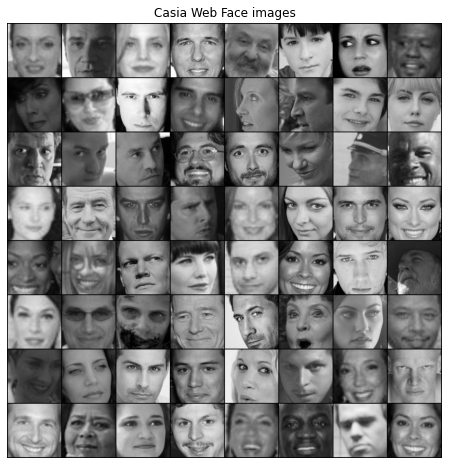

In [5]:
real_batch = next(iter(sample_loader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Casia Web Face images")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device), padding=2, normalize=True).cpu(),(1,2,0)))
plt.savefig('Casia_Web_Face.png')
plt.show()

In [6]:
# tensorboard
# !pip uninstall -q tensorboard tb-nightly
# !pip install -U tb-nightly
%load_ext tensorboard
from torch.utils.tensorboard import SummaryWriter

# my old model

In [7]:
class BlockDiscriminator(nn.Module):
  def __init__(self, in_ch, out_ch, stride, type):
    super(BlockDiscriminator, self).__init__()
    if type == 1:
      self.block_disc = nn.Sequential(
          nn.Conv2d(in_ch, out_ch, kernel_size=2)
      )
    elif type == 2:
      self.block_disc = nn.Sequential(
          nn.Conv2d(in_ch, out_ch, kernel_size=3, stride = stride, padding = 1),
          nn.BatchNorm2d(out_ch),
          nn.LeakyReLU()
      )
    else:
      self.block_disc = nn.Sequential(
          nn.Conv2d(in_ch, out_ch, kernel_size=3, stride = stride),
          nn.LeakyReLU()
      )
  
  def forward(self, input):
    return self.block_disc(input)

In [8]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()
    self.disc = nn.ModuleList([
                               BlockDiscriminator(1, 1, 2, type=1),
                               BlockDiscriminator(1, 1, 2, type=2),
                               BlockDiscriminator(1, 1, 2, type=2),
                               BlockDiscriminator(1, 1, 1, type=2),
                               BlockDiscriminator(1, 1, 1, type=3),
                               nn.Sigmoid()
    ])
  
  def forward(self, input):
    for layer in self.disc:
      output = layer(input)
      input = output
    return output


In [ ]:
inp = torch.randn(1,1,128,128)
model = Discriminator()
out = model(inp).view(-1)
out.shape

torch.Size([900])

In [ ]:
# Encoder as U-Net
class Enc_block(nn.Module):
  def __init__(self, in_ch, out_ch):
    super(Enc_block, self).__init__()
    self.enc_block = nn.Sequential(
        nn.Conv2d(in_ch, out_ch, kernel_size = 4, stride = 2, padding = 1),
        nn.BatchNorm2d(out_ch),
        nn.LeakyReLU(inplace=True),
    )

  def forward(self, input):
    return self.enc_block(input)
  

In [ ]:
class Dec_block(nn.Module):
  def __init__(self, in_ch, out_ch):
    super(Dec_block, self).__init__()
    self.dec_block = nn.Sequential(
        nn.ConvTranspose2d(in_ch, out_ch, kernel_size = 4, stride = 2, padding = 1),
        nn.BatchNorm2d(out_ch),
        nn.ReLU(inplace=True),
    )

  def forward(self, input):
    return self.dec_block(input)

In [ ]:
class Unet(nn.Module):
  def __init__(self, in_ch = 1, out_ch = 1, features=[4, 8, 16, 32, 64, 128]):
    super(Unet, self).__init__()
    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    self.downs = nn.ModuleList([
                                Enc_block(1, 8),
                                Enc_block(8, 16),
                                Enc_block(16, 32),
                                Enc_block(32, 64),
                                Enc_block(64, 128),
                                nn.Sequential(
                                    nn.Conv2d(128, 256, kernel_size = 4, stride = 2, padding = 1), 
                                    nn.LeakyReLU(),
                                )                                
    ])

    self.ups = nn.ModuleList([
                              nn.Sequential(
                                  nn.ConvTranspose2d(512, 128, kernel_size=3),
                                  nn.BatchNorm2d(128),
                                  nn.Dropout(0.5),
                                  nn.ReLU(inplace=True)),
                              Dec_block(256, 64),
                              Dec_block(128, 32),
                              Dec_block(64, 16),
                              Dec_block(32, 8),
                              nn.Sequential(
                                  nn.ConvTranspose2d(16, 4, kernel_size=4, stride=2, padding=2),
                                  nn.BatchNorm2d(4),
                              )
    ])
    
    self.bottleneck = nn.Sequential(
        nn.ConvTranspose2d(256, 256, kernel_size=4, padding=1),
        nn.BatchNorm2d(256),
        nn.Dropout(0.5),
        nn.ReLU(inplace=True),
        nn.MaxPool2d(2)
    )

    self.final_conv = nn.Sequential(
        nn.ConvTranspose2d(4, 1, kernel_size=3),
        nn.ReLU(inplace=True),
        nn.Sigmoid()
    )

  def forward(self, input):
    skip_connections = []
    for down in self.downs:
      input = down(input)
      skip_connections.append(input)
    

    input = self.bottleneck(input)
    skip_connections = skip_connections[::-1] ### reversed list
    
    skip_connections_shape = []
    for i in skip_connections:
      skip_connections_shape.append(i.shape)

    for idx in range(0, len(self.ups), 1):
      skip_connection = skip_connections[idx]
      if input.shape != skip_connection.shape:
        input = TF.resize(input, size = skip_connection.shape[2:])
      concat_skip = torch.cat((skip_connection, input), dim = 1)
      input = self.ups[idx](concat_skip)
      
    return self.final_conv(input)

---

# my new model

In [7]:
class Block(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, act="relu", use_dropout=False):
        super(Block, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, 2, 1, bias=False, padding_mode="reflect")
            if down
            else nn.ConvTranspose2d(in_channels, out_channels, 4, 2, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU() if act == "relu" else nn.LeakyReLU(0.2),
        )

        self.use_dropout = use_dropout
        self.dropout = nn.Dropout(0.5)
        self.down = down

    def forward(self, x):
        x = self.conv(x)
        return self.dropout(x) if self.use_dropout else x


class Generator_new(nn.Module):
    def __init__(self, in_channels=1, features=32):
        super().__init__()
        self.initial_down = nn.Sequential(
            nn.Conv2d(in_channels, features, 4, 2, 1, padding_mode="reflect"),
            nn.LeakyReLU(0.2),
        )
        self.down1 = Block(features, features * 2, down=True, act="leaky", use_dropout=False)
        self.down2 = Block(
            features * 2, features * 4, down=True, act="leaky", use_dropout=False
        )
        self.down3 = Block(
            features * 4, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down4 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down5 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down6 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.bottleneck = nn.Sequential(
            nn.Conv2d(features * 8, features * 8, 4, 2, 1), nn.ReLU()
        )

        self.up1 = Block(features * 8, features * 8, down=False, act="relu", use_dropout=True)
        self.up2 = Block(
            features * 8 * 2, features * 8, down=False, act="relu", use_dropout=True
        )
        self.up3 = Block(
            features * 8 * 2, features * 8, down=False, act="relu", use_dropout=True
        )
        self.up4 = Block(
            features * 8 * 2, features * 4, down=False, act="relu", use_dropout=False
        )
        self.up5 = Block(
            features * 8, features * 2, down=False, act="relu", use_dropout=False
        )
        self.up6 = Block(
            features * 4 , features, down=False, act="relu", use_dropout=False
        )
        self.up7 = Block(features * 2 * 2, features, down=False, act="relu", use_dropout=False)
        self.final_up = nn.Sequential(
            nn.ConvTranspose2d(features * 2, in_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
            nn.Sigmoid()
        )

    def forward(self, x):
        d1 = self.initial_down(x)
        # print('d1', d1.shape)
        d2 = self.down1(d1)
        # print('d2', d2.shape)
        d3 = self.down2(d2)
        # print('d3', d3.shape)
        d4 = self.down3(d3)
        # print('d4', d4.shape)
        d5 = self.down4(d4)
        # print('d5', d5.shape)
        d6 = self.down5(d5)
        # print('d6', d6.shape)
        bottleneck = self.bottleneck(d6)
        # print('bottleneck', bottleneck.shape)
        up1 = self.up1(bottleneck)
        # print('up1', up1.shape)
        up2 = self.up2(torch.cat([up1, d6], 1))
        # print('up2', up2.shape)
        up3 = self.up3(torch.cat([up2, d5], 1))
        # print('up3', up3.shape)
        up4 = self.up4(torch.cat([up3, d4], 1))
        # print('up4', up4.shape)
        # print('torch.cat([up4, d3]', torch.cat([up4, d3], 1).shape)
        up5 = self.up5(torch.cat([up4, d3], 1))
        # print('up5', up5.shape)
        # print('torch.cat([up5, d2], 1)', torch.cat([up5, d2], 1).shape)
        up6 = self.up6(torch.cat([up5, d2], 1))
        # print('up6', up6.shape)
        # up7 = self.up7(torch.cat([up6, d2], 1))
        # print('torch.cat([up6, d1], 1)', torch.cat([up6, d1], 1).shape)
        # print(self.final_up(torch.cat([up6, d1], 1)).shape)
        return self.final_up(torch.cat([up6, d1], 1))

In [8]:
class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super(CNNBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(
                in_channels, out_channels, 4, stride, 1, bias=False, padding_mode="reflect"
            ),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        return self.conv(x)


class Discriminator_new(nn.Module):
    def __init__(self, in_channels=1, features=[32, 64, 128, 256]):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(
                in_channels ,
                features[0],
                kernel_size=4,
                stride=2,
                padding=1,
                padding_mode="reflect",
            ),
            nn.LeakyReLU(0.2),
        )

        layers = []
        in_channels = features[0]
        for feature in features[1:]:
            layers.append(
                CNNBlock(in_channels, feature, stride=1 if feature == features[-1] else 2),
            )
            in_channels = feature

        layers.append(
            nn.Conv2d(
                in_channels, 1, kernel_size=4, stride=1, padding=1, padding_mode="reflect"
            ),
        )
        layers.append(nn.Sigmoid())
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        # x = torch.cat([x, y], dim=1)
        x = self.initial(x)
        x = self.model(x)
        return x


# something to test

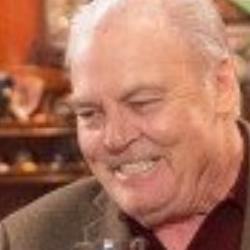

In [ ]:
# image = Image.open(df.iloc[1, 0])
# trans = transforms.Compose([
#                             transforms.CenterCrop((128, 128)), 
#                             # transforms.Grayscale(),
#                             transforms.ToTensor()
#                             ])
# image = trans(image)
# image.shape
# image_to_show = Image.open(df.iloc[1, 0])
# image_to_show

In [ ]:
# model = Unet_NEWWWWW()

# image_new = torch.unsqueeze(image, 0)
# image_new.shape

# output_unet = model(image_new)

# # output_unet = torch.squeeze(output_unet, 1)
# # output_unet = output_unet.repeat(3, 1, 1)
# output_unet.shape

torch.Size([1, 3, 128, 128])

In [ ]:
# output_unet = torch.squeeze(output_unet, 0)
# output_unet.shape

torch.Size([3, 128, 128])

In [ ]:
# output_unet.permute(1, 2, 0).detach().numpy().shape

(128, 128, 3)

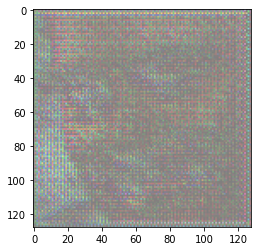

In [ ]:
# plt.imshow(output_unet.permute(1, 2, 0).detach().numpy())
# # plt.imshow(output_unet.detach())

---

# training model

In [9]:
lr = 3e-4
batch_size = 64
num_epochs = 5
n_noise = 256
n_critic = 1


In [10]:
discriminator = Discriminator_new().to(device)
generator = Generator_new().to(device)

criterion_gan = nn.BCELoss()
D_opt = torch.optim.Adam(discriminator.parameters(), lr = lr)
G_opt = torch.optim.Adam(generator.parameters(), lr = lr)
fixed_noise = torch.randn((batch_size, 1, 128, 128)).to(device)

In [11]:
writer_fake = SummaryWriter(f"logs/fake")
writer_real = SummaryWriter(f"logs/real")

In [12]:
G_losses = []
D_losses = []
img_list = []

for epoch in range(num_epochs):
  for idx, images in enumerate(sample_loader, 0):
    
    step = 0
    real_imgs = images.to(device)
    batch_size = real_imgs.size(0)
    noise = torch.randn(real_imgs.size(0), 1, 128, 128, device=device)

    D_opt.zero_grad()
    G_opt.zero_grad()

    fake = generator(noise)
    disc_real = discriminator(real_imgs)
    D_loss_1 = criterion_gan(disc_real, torch.ones_like(disc_real))
    disc_fake = discriminator(fake)
    D_loss_2 = criterion_gan(disc_fake, torch.zeros_like(disc_fake))
    D_loss = (D_loss_1 + D_loss_2) / 2
    D_opt.zero_grad()
    D_loss.backward(retain_graph=True)
    D_opt.step()

    output = discriminator(fake)
    G_loss = criterion_gan(output, torch.ones_like(output))
    G_opt.zero_grad()
    G_loss.backward()
    G_opt.step()

    G_losses.append(G_loss.item())
    D_losses.append(D_loss.item())

    if idx % 100 == 0:
      print(f"Epoch [{epoch}/{num_epochs}] Batch {idx}/{len(sample_loader)} \
                Loss D: {D_loss:.4f}, loss G: {G_loss:.4f}"
      )

    if idx % 100 == 0:
      with torch.no_grad():
        fake = generator(fixed_noise)
        data = real_imgs
        img_grid_real = torchvision.utils.make_grid(data, normalize = True)
        img_grid_fake = torchvision.utils.make_grid(fake, normalize = True)
        writer_real.add_image("Real", img_grid_real, global_step=step)
        writer_fake.add_image("Fake", img_grid_fake, global_step=step)
      step += 1

Epoch [0/5] Batch 0/1563                 Loss D: 0.7092, loss G: 0.6527
Epoch [0/5] Batch 100/1563                 Loss D: 0.1202, loss G: 2.8388
Epoch [0/5] Batch 200/1563                 Loss D: 0.0308, loss G: 4.2373
Epoch [0/5] Batch 300/1563                 Loss D: 0.0089, loss G: 5.4715
Epoch [0/5] Batch 400/1563                 Loss D: 0.0098, loss G: 6.7054
Epoch [0/5] Batch 500/1563                 Loss D: 0.0037, loss G: 5.9760
Epoch [0/5] Batch 600/1563                 Loss D: 0.0061, loss G: 6.5976
Epoch [0/5] Batch 700/1563                 Loss D: 0.0052, loss G: 6.7350
Epoch [0/5] Batch 800/1563                 Loss D: 0.0036, loss G: 7.2047
Epoch [0/5] Batch 900/1563                 Loss D: 0.0508, loss G: 6.6014
Epoch [0/5] Batch 1000/1563                 Loss D: 0.0314, loss G: 5.4019
Epoch [0/5] Batch 1100/1563                 Loss D: 0.0155, loss G: 7.1226
Epoch [0/5] Batch 1200/1563                 Loss D: 0.0088, loss G: 6.9962
Epoch [0/5] Batch 1300/1563          

In [13]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 1182), started 1:52:19 ago. (Use '!kill 1182' to kill it.)

<IPython.core.display.Javascript object>

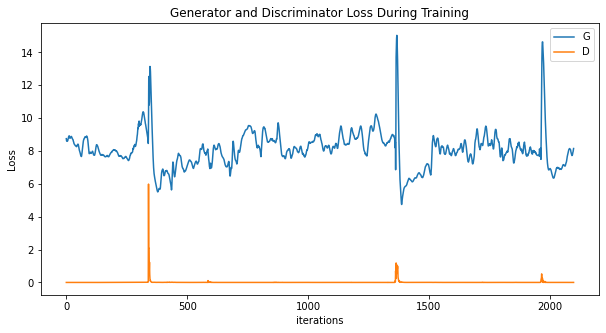

In [18]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [29]:
# #%%capture
# fig = plt.figure(figsize=(8,8))
# plt.axis("off")
# ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
# ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

# HTML(ani.to_jshtml())

In [30]:
# # Grab a batch of real images from the dataloader
# real_batch = next(iter(sample_loader))

# # Plot the real images
# plt.figure(figsize=(15,15))
# plt.subplot(1,2,1)
# plt.axis("off")
# plt.title("Real Images")
# plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# # Plot the fake images from the last epoch
# plt.subplot(1,2,2)
# plt.axis("off")
# plt.title("Fake Images")
# plt.imshow(np.transpose(img_list[-1],(1,2,0)))
# plt.savefig('DCGAN_epochs5.png')
